# Introduction

This research work has focused on theoretically and empirically analyzing the execution times of cosine similarity and Jaccard similarity methods, used to assess the similarity between documents.

To achieve this, the decision was made to graphically visualize the behavior of execution time as input data increases. Additionally, the gradient has been calculated to confirm the time complexity, and the time constants, facilitating a clear understanding of its temporal complexities.

Furthermore, the execution times of both methods have been compared, as well as the Cosine similarity method using matrix multiplication through the Strassen method, providing a comprehensive perspective on performance. Time differences between sequential and parallel execution methods have also been explored, assessing the speed improvement achievable through parallelism.

This report aims to offer a clear insight into the time complexity of the mentioned methods and delve into comparisons that will provide valuable insights into their efficiency.

-------------------------------------------------------------------------------------- Preparation of data --------------------------------------------------------------------------------

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import time
import numpy as np
import math
import random

In [2]:
# This is the main DataFrame used in to answer the questions.
# It contains the frecuencies of words in 21 documents.

data=pd.read_csv("data2023.csv", index_col=0)  

In [3]:
data

,doc1,doc2,doc3,doc4,doc5,doc6,doc7,doc8,doc9,doc10,doc11,doc12,doc13,doc14,doc15,doc16,doc17,doc18,doc19,doc20
A,0,6,5,7,9,13,16,12,14,22,17,27,32,17,28,28,47,41,35,32
A-tu,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0
A.,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0
ABC,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Aah,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
états,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
étranger,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0
évidence.,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
êtes,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0


In [112]:
# Function used to measure the time taken to execute each function
# Provided for Adam Barrett in the Algorithmic Data Science module, at University of Sussex

def timeit(somefunc,*args,repeats=5,**kwargs):
    times=[]
    for i in range(repeats):
        starttime=time.time()
        ans=somefunc(*args,**kwargs)
        endtime=time.time()
        timetaken=endtime-starttime
        times.append(timetaken)
    
    mean=np.mean(times)
    stdev=np.std(times)
 
    return (mean,stdev)

----------------------------------------------------------------------------------------------------

# Question 1

### Section 1.1.- Present an analysis of the theoretical running time of the cosine similarity measure applied to a pair of documents with data in the format of the provided data matrix

The time complexity of cosine similarity in this case is directly proportional to the total number of unique words across both documents. This is due to the algorithm iterating through both documents with a single for loop, where the iterator corresponds to the index of each element in the documents. Within this loop, only arithmetic operations are performed, aiming to calculate the dot product between two vectors (where each vector, in this case, is represented as the frecuencies of words in both documents). 

In terms of Big O notation, the time complexity is represented by a linear behavior (O(n)), but it may appear constant (O(1)) when the lengths of the documents are similar. To better visualize the linear behavior, it's recommended to gradually increase the number of words in certain documents. 

### Section 1.2. Test your analysis empirically by timing and plotting various calculations of cosine similarity on your computer

In [57]:
# Cosine similarity function provided by Adam Barrett in the module of Algorithmic Data Science

def naiveCosine (a , b):
    num=0
    d1=0
    d2=0
    for i in range(len(a)): 
        num += a[ i ] *b [ i ] 
        d1 += a [ i ] *a [ i ]
        d2 += b [ i ] *b [ i ]
    return round(num/(d1*d2)**0.5,2)

In [58]:
# This an execution of the function above, measuring the similarity of the first two documents

naiveCosine(data["doc1"], data["doc2"])

0.96

In [62]:
# This vector contains the number of words used for measuring similarity of Cosine Similarity
# Each value will be used in each iteration 

sizes = [i for i in range(1000, len(data), 1000)]

In [191]:
# This vector contains the time taken for measuring the similarity between document 1 and 2
# In each iteration the number of words taken into account increases

cosine_sizes_times = [timeit(naiveCosine, data["doc1"][:i], data["doc2"][:i], repeats = 15)[0] for i in sizes]

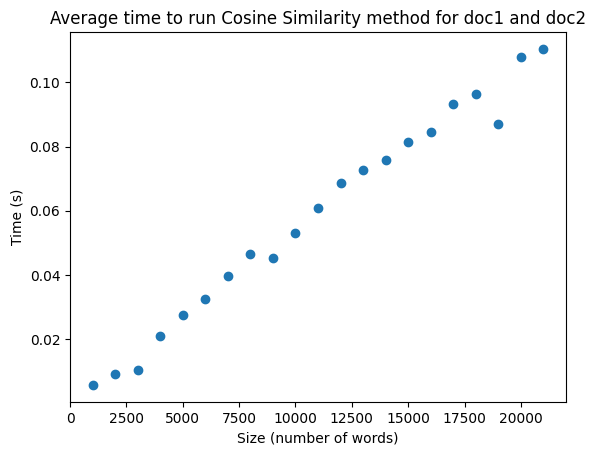

In [192]:
plt.scatter(sizes, cosine_sizes_times)  
plt.xlabel('Size (number of words)')
plt.ylabel('Time (s)')
plt.title('Average time to run Cosine Similarity method for doc1 and doc2')

plt.show()

### Section 1.3. Estimate the key constant in the formula for the run-time, for your implementation and computer

In [193]:
# This vector contains the log values of the vector "cosine_sizes_times"

cosine_sizes_times_log = [math.log(i) for i in cosine_sizes_times]

In [194]:
# Likewise, this vector contains the log values of the vector "sizes"

sizes_cosine_log = [math.log(i) for i in sizes]

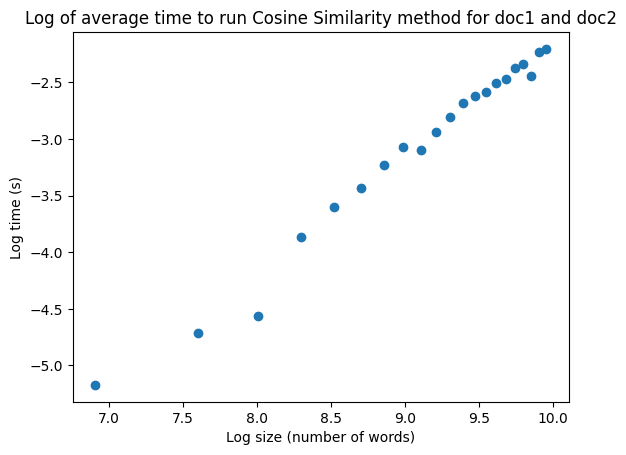

In [195]:
plt.scatter(sizes_cosine_log , cosine_sizes_times_log)

plt.xlabel('Log size (number of words)')
plt.ylabel('Log time (s)')
plt.title('Log of average time to run Cosine Similarity method for doc1 and doc2')

plt.show()

From scipy, stats.linregress makes a linear regression and outputs some statistics values. The gradient and interception are obtained by this library. Then $$ca= e^n$$ 
where n is the interception and ca is the constant time.


In [196]:
from scipy import stats 

In [197]:
def cosine_ca(x,y):
    cosine_stats = stats.linregress(x, y)
    cosine_gradient = cosine_stats.slope
    cosine_intercept = cosine_stats.intercept
    print("Gradient: ", cosine_gradient) 
    print("Interception:",cosine_intercept)
    cosine_ca = np.exp(cosine_intercept)
    print("Key constant ", cosine_ca) # Key constant is e^(interception)

In [198]:
cosine_x = sizes_cosine_log
cosine_y = cosine_sizes_times_log

In [199]:
cosine_ca(cosine_x, cosine_y)

Gradient:  1.03789892586079
Interception: -12.503739095872326
Key constant  3.7127448770138245e-06


### Section 1.4. Compare using the implementation of the dot product in numpy with your own implementation

In [83]:
def naiveCosine_Numpy(document1, document2):
    document1 = np.array(document1)
    document2 = np.array(document2)
    return (np.dot(document1, document2))/ ((np.dot(document1, document1))*(np.dot(document2, document2)))**(1/2)

In [84]:
print(naiveCosine_Numpy(data["doc2"], data["doc3"]))

0.9455350708031566


In [85]:
cosine_numpy_sizes_times_data = [timeit(naiveCosine_Numpy, data["doc1"][:i], data["doc2"][:i])[0] for i in sizes]

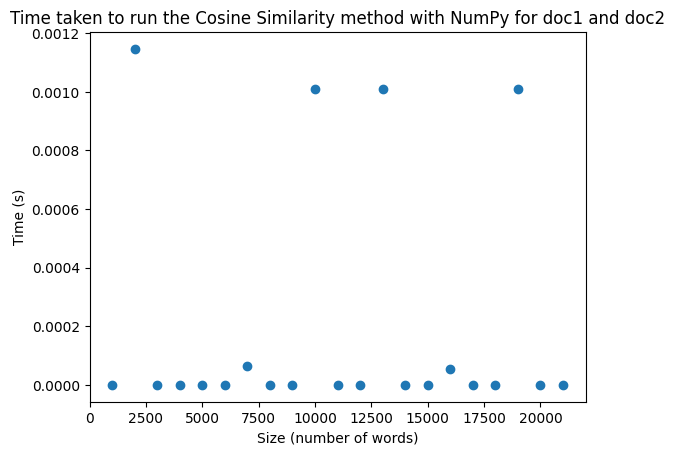

In [86]:
plt.scatter(sizes, cosine_numpy_sizes_times_data)
plt.xlabel('Size (number of words)')
plt.ylabel('Time (s)')
plt.title('Time taken to run the Cosine Similarity method with NumPy for doc1 and doc2')

plt.show()

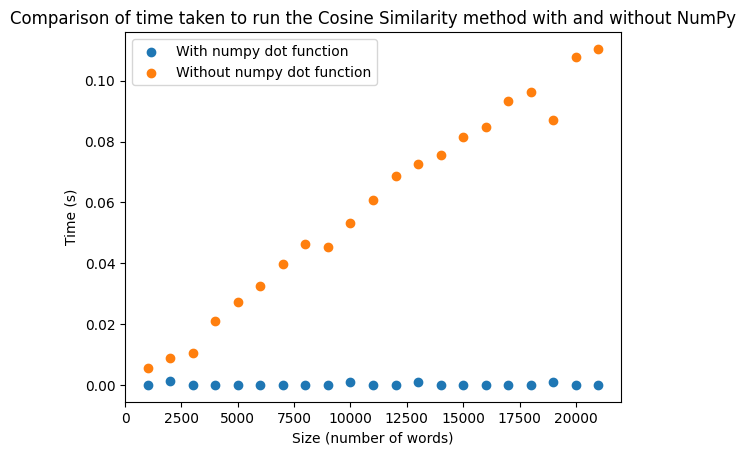

In [200]:
plt.scatter(sizes, cosine_numpy_sizes_times_data, label = "With numpy dot function")  
plt.scatter(sizes, cosine_sizes_times, label =  "Without numpy dot function")  
plt.xlabel('Size (number of words)')
plt.ylabel('Time (s)')
plt.title('Comparison of time taken to run the Cosine Similarity method with and without NumPy')
plt.legend()

plt.show()

The time taken to run the Cosine Similarity method with NumPy remains constant as the number of words increases. Consequently, the time complexity in terms of Big O notation for the Cosine Similarity, using the NumPy implementation of the dot product, is O(1). This constancy is likely because NumPy's dot function possibly avoids using explicit for loops. In contrast, the time complexity of the implementation in Section 1.1 is linear, while that of the NumPy dot function remains constant.

# Question 2

### Section 2.1. Present an analysis of the theoretical running time of Jaccard’s similarity measure applied to a pair of documents with data in the format of the provided data matrix.

In this case, the time complexity of the Jaccard similarity algorithm is linear, denoted as O(n) in terms of Big O notation, where n is the total number of unique words in both documents. The reason behind this, is that the  algorithm iterates through each document using a single for loop, calculating the minimum value between frecuencies of each word in both documents and appending it to a vector, representing the intersections of each word. Despite calling another function afterward to calculate the total number of intersections between the entire documents, which also includes a for loop, there is no nested loop, and thus the overall time complexity remains linear. 

As stated in Question 1, Section 1, it's necessary to store every unique word from both documents in a data structure, associating each word with its frequency and maintaining the same order. Failure to do so would require a nested for loop to match frequencies, elevating the time complexity to O(n^2).

### Section 2.2. Test your analysis empirically by timing and plotting various calculations of Jaccard similarity on your computer

In [179]:
# Jaccard similarity function adapted to the Pandas DataFrame
# The original function was provided by Adam Barrett in the module of Algorithmic Data Science

def maketotal(intersection):
    total = 0
    for i in range(len(intersection)):
        total+= intersection[i]
    return total

def jaccard(document1, document2):
    intersection = []
    for i in range(len(document1)):
        intersection.append(min(document1[i], document2[i]))
        
    intersectiontot = maketotal(intersection)
    union = maketotal(document1) + maketotal(document2) - intersectiontot
    return round(intersectiontot/union, 2)

In [180]:
jaccard(data["doc1"], data["doc2"])

0.5

In [181]:
sizes = [i for i in range(1000, len(data), 1000)]

In [182]:
jaccard_sizes_times = [timeit(jaccard, data["doc1"][:i], data["doc2"][:i], repeats = 15)[0] for i in sizes]

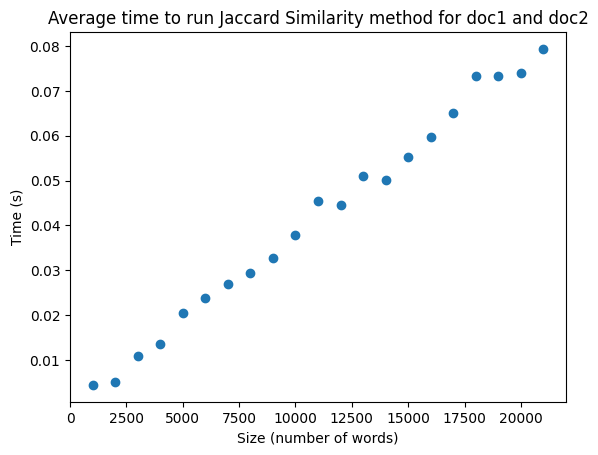

In [183]:
plt.scatter(sizes, jaccard_sizes_times)

plt.xlabel('Size (number of words)')
plt.ylabel('Time (s)')
plt.title('Average time to run Jaccard Similarity method for doc1 and doc2')

plt.show()

### 2.3. Estimate the key constant in the formula for the run-time, for your implementation and computer

In [184]:
jaccard_sizes_times_log = [math.log(i) for i in jaccard_sizes_times]

In [185]:
sizes_jaccard_log = [math.log(i) for i in sizes]

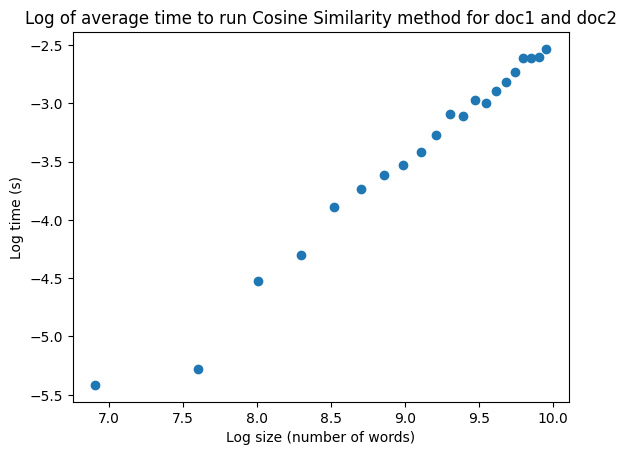

In [186]:
plt.scatter(sizes_jaccard_log , jaccard_sizes_times_log)

plt.xlabel('Log size (number of words)')
plt.ylabel('Log time (s)')
plt.title('Log of average time to run Cosine Similarity method for doc1 and doc2')

plt.show()

In [187]:
def jaccard_ca(x,y):
    jaccard_stats = stats.linregress(x, y)
    jaccard_gradient = jaccard_stats.slope
    jaccard_intercept = jaccard_stats.intercept
    print("Gradient: ", jaccard_gradient) # This should be close to 1 as time-complexity is linear
    print("Interception:",jaccard_intercept)
    jaccard_ca = np.exp(jaccard_intercept)
    print("Key constant ", jaccard_ca) 

In [188]:
jaccard_x = sizes_jaccard_log
jaccard_y = jaccard_sizes_times_log

In [189]:
jaccard_ca(jaccard_x,jaccard_y)

Gradient:  1.02498619327007
Interception: -12.72195927520331
Key constant  2.9848553382159265e-06


# Question 3

### Section 3.1. What is the theoretical worst-case running time for computing all-pairs similarities on a data matrix such as the one provided?

In scenarios where the number of documents and words remains constant, the theoretical worst-case scenario for computing all-pairs similarities occurs when there are no zero-frequency occurrences among the words and documents. This implies that every word appears at least once, or multiple times, in all documents.

Furthermore, as the frequency of words in the documents increases, there is an increase in the time taken to perform the calculations. For Cosine Similarity, it needs iterating through the word frequencies in both documents and performing a cumulative sum of the multiplied frequencies. When most values are non-zero, the computation becomes more costly. A similar consideration applies to Jaccard Similarity, where the cumulative sum of the number of intersections needs to be calculated. If there are few intersections, the cumulative sum is computed more rapidly.

These factors indicate that, in general, the efficiency of calculations is negatively impacted by the presence of non-zero frequencies and an increase in the number of words in the documents.

### Section 3.2. Does it make a difference which similarity measure is being computed? 

Yes, as can be observed below, the average time execution of both methods is measured, showing that Jaccard method is faster. The difference increases when larger matrices are used. Even though, there is no change in the time complexity of both methods. 

In [33]:
jaccard_average_time = timeit(jaccard, data["doc1"], data["doc2"],repeats=300)[0]
cosine_average_time =  timeit(naiveCosine, data["doc1"], data["doc2"],repeats=300)[0]

In [34]:
print("Jaccard average time:", jaccard_average_time)
print("Cosine average time:", cosine_average_time)

Jaccard average time: 0.0766745670636495
Cosine average time: 0.11361240863800048


In [35]:
jaccard_difference = ((jaccard_average_time*100)/ cosine_average_time)
percentage_time_difference = 100 - jaccard_difference   
print("\nJaccard method is", round(percentage_time_difference,2), "% faster than Cosine Similarity method")


Jaccard method is 32.51 % faster than Cosine Similarity method


What's more, in the figure below can be visually observed that Jaccard Similarity method is faster than Cosine Similarity method, this persists over each test. This is a comparison of graphs in Section 1.2 and 2.2.

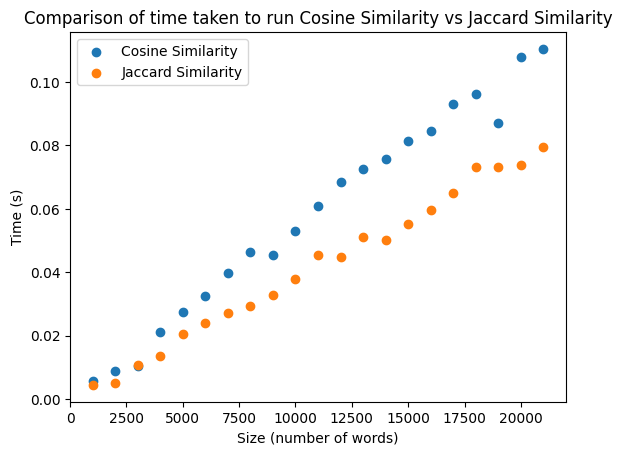

In [201]:
plt.scatter(sizes, cosine_sizes_times, label='Cosine Similarity')  
plt.scatter(sizes, jaccard_sizes_times, label='Jaccard Similarity') 
plt.xlabel('Size (number of words)')
plt.ylabel('Time (s)')
plt.title("Comparison of time taken to run Cosine Similarity vs Jaccard Similarity")
plt.legend()

plt.show()

### Section 3.3. Estimate the key constant in the all-pairs similarity run-time formula for both Jaccard and cosine similarity.

---------------------------------------------------------- Jaccard Similarity all-pairs similarity key constant and run-time -------------------------------------------------------

----------------------------------------------------------------------------- Jaccard Similarity run-time -----------------------------------------------------------------------------------

In [202]:
docs = [i for i in range(1,15)]

In [203]:
# This function calculates all-pairs similarities 
# And allows to gradually increase the number of documents taken into account

def jaccard_all_pairs_similarites(data, docs):
    for i in range(1, docs):
        for j in range(1, docs):
            jaccard(data[f"doc{i}"], data[f"doc{j}"])

In [204]:
# It takes several minutes to complete the execution

jaccard_pairs_times = [timeit(jaccard_all_pairs_similarites, data, i)[0] for i in docs]

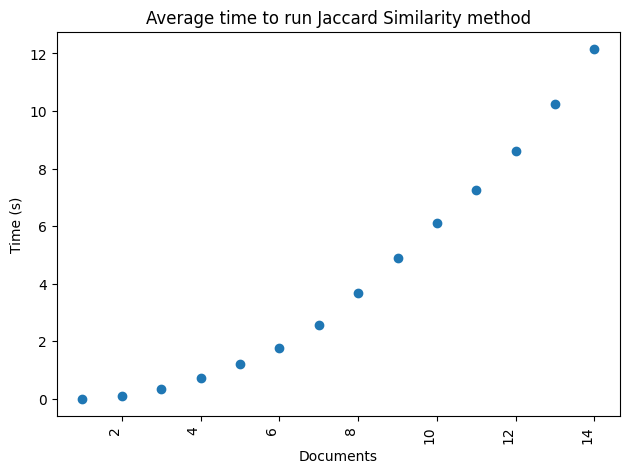

In [205]:
plt.scatter(docs, jaccard_pairs_times)

plt.xlabel('Documents')
plt.ylabel('Time (s)')
plt.title('Average time to run Jaccard Similarity method')
plt.tight_layout()
plt.xticks(rotation=90, ha='right') 

plt.show()

------------------------------------------------------------------ Jaccard Similarity all-pairs key constant -------------------------------------------------------------------------

In [206]:
jaccard_pairs_times_log = [math.log(i) for i in jaccard_pairs_times[1:]]

In [207]:
docs_log = [math.log(i) for i in docs[1:]]

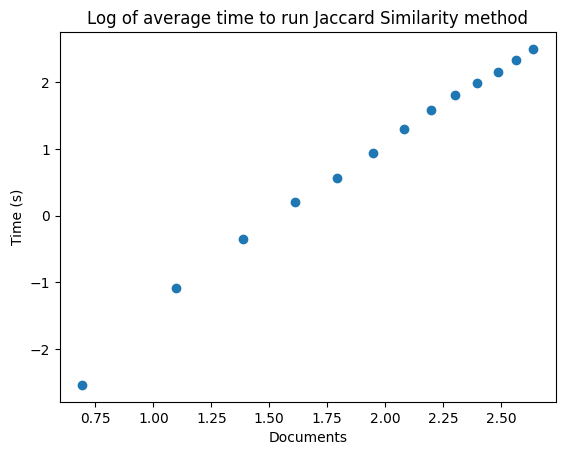

In [208]:
plt.scatter(docs_log, jaccard_pairs_times_log)
   
plt.xlabel('Documents')
plt.ylabel('Time (s)')
plt.title('Log of average time to run Jaccard Similarity method')

plt.show()

In [209]:
jaccard_x_pairs = [i for i in docs_log]
jaccard_y_pairs = jaccard_pairs_times_log

In [210]:
jaccard_ca(jaccard_x_pairs ,jaccard_y_pairs)

Gradient:  2.4787753404518154
Interception: -3.9265856989133305
Key constant  0.019710856593614517


-------------------------------------------------------------------------------------------------------------------------

------------------------------------------------------- Cosine Similarity all-pairs similarity key constant and run-time ----------------------------------------------------------

------------------------------------------------------------------------ Cosine Similarity run-time ----------------------------------------------------------------------------------------

In [211]:
def cosine_all_pairs_similarities(data, docs):
    for i in range(1, docs):
        for j in range(1, docs):
            naiveCosine(data[f"doc{i}"], data[f"doc{j}"])  

In [212]:
# It takes several minutes to complete the execution

cosine_pairs_times = [timeit(cosine_all_pairs_similarities, data, i)[0] for i in docs]

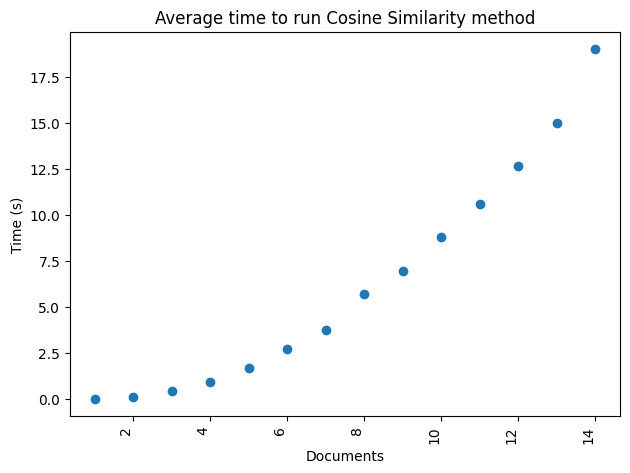

In [213]:
plt.scatter(docs, cosine_pairs_times)

plt.xlabel('Documents')
plt.ylabel('Time (s)')
plt.title('Average time to run Cosine Similarity method')
plt.tight_layout()
plt.xticks(rotation=90, ha='right') 

plt.show()

------------------------------------------------------------------ Cosine Similarity all-pairs key constant -------------------------------------------------------------------

In [214]:
docs_log = [math.log(i) for i in docs[1:]]

In [215]:
cosine_pairs_times_log = [math.log(i) for i in cosine_pairs_times[1:]]

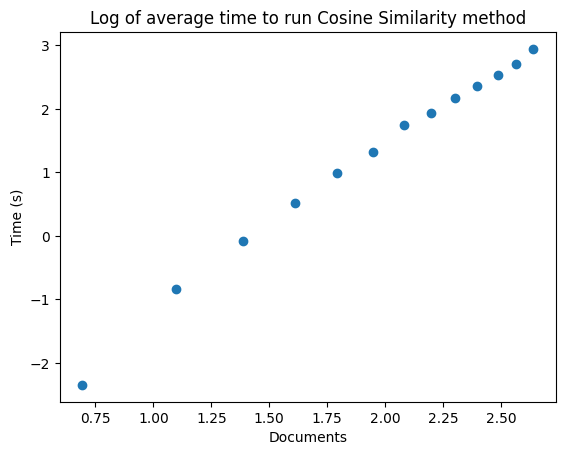

In [216]:
plt.scatter(docs_log, cosine_pairs_times_log)
   
plt.xlabel('Documents')
plt.ylabel('Time (s)')
plt.title('Log of average time to run Cosine Similarity method')

plt.show()

In [217]:
cosine_x_pairs = docs_log
cosine_y_pairs = cosine_pairs_times_log

In [218]:
cosine_ca(cosine_x_pairs, cosine_y_pairs)

Gradient:  2.5891204753528214
Interception: -3.790251374414489
Key constant  0.022589922608774533


It's important to note that the more amount pairs are used, the more accurate the gradient, intercept, and key constant calculations will be.

# Question 4

### Section 4.1. Write a function that implements all-pairs similarities for one of the similarity measures, using some form of parallel computing

------------------------------------------------------------------------------- Parallelism using multiprocessing library ---------------------------------------------------------------------------

In [100]:
def parallel_function_mult(DataFrame, amount_docs):
    num_processes = len(amount_docs)
    dataFrames = [DataFrame]* num_processes
    process = Pool(processes = num_processes)
    process.starmap(jaccard_all_pairs_similarites, zip(dataFrames, amount_docs))
    process.close()
    return 

------------------------------------------------------------------------------- Parallelism using concurrent.futures library -------------------------------------------------------------------------

In [101]:
def parallel_function_conc(DataFrame, amount_docs):
    num_processes = len(amount_docs)
    dataFrames = [DataFrame] * num_processes
    with ProcessPoolExecutor(max_workers=num_processes) as executor:
        executor.map(jaccard_all_pairs_similarites, dataFrames, amount_docs)

### Section 4.2. Analyse theoretically and empirically how much speed up it is possible to achieve on your computer.

-------------------------------------------------------------------------------------- Theoretically -------------------------------------------------------------------------------------------------

As seen in Section 3.3, calculating the key constant required running the all-pairs similarities function while incrementing the number of documents from 1 to 21. From this, it was observed that the all-pairs similarities function exhibits quadratic complexity. The same process will be performed for both, the version in Section 3.3 and its parallel version.

In theory, if this function could be perfectly divided among each CPU core, where each core executes the function with a different number of documents, the time taken for the function to be executed for all-pairs similarities would be approximately the time it takes to execute only the one with the highest number of documents (21). Therefore, the total time would be equivalent to running the function only once for the maximum number of documents.

However, achieving the ideal speedup is not possible since the number of cores in the machine used for this test is 10. Therefore, it is expected that the total time taken will be greater. In theory, the more processes used to execute the function, the less time it will take until the number of processes equals the number of CPU cores. From this point onward, the time taken will remain relatively constant.

--------------------------------------------------------------------------------------- Empirically -------------------------------------------------------------------------------------------------

Due to issues with Jupyter Notebook in performing parallelism tasks using the multiprocessing library, it was chosen to explore the concurrent.futures library. However, the same problems were encountered with this latter library.

The problem lies solely within Jupyter Notebook, as numerous tests were conducted with the same code in Visual Studio Code, yielding satisfactory results. Therefore, two files have been provided in the same folder as this Jupyter Notebook: "parallel_concurrentfutures_4th_Question.py" and "parallel_multiprocessing_4th_Question.py". You can choose either of them, as both fulfill the objectives of this question, albeit with different libraries. 

Alternatively, it is also possible to copy and paste the cells below (Parallelism  using multiprocessing library or Parallelism using concurrent.futures library), into a different Python IDE, as they contain the exact code from the aforementioned files.

-------------------------------------------------------------------------- Parallelism using multiprocessing library ---------------------------------------------------------------------------

In [56]:
# This code has been tested several times in Visual Studio Code and works well
# However, there are multiprocessing issues in Jupyter Notebook.

# runs "parallel_concurrentfutures_4th_Question.py" or "parallel_multiprocessing_4th_Question.py" 

# This cell contains the code of the files mentioned. It can be also copied and pasted it into another IDE

from multiprocessing import Pool
import time
import pandas as pd
import matplotlib.pyplot as plt
import time
import numpy as np


def timeit(somefunc,*args,repeats=1,**kwargs):
    times=[]
    for i in range(repeats):
        starttime=time.time()
        ans=somefunc(*args,**kwargs)
        endtime=time.time()
        timetaken=endtime-starttime
        times.append(timetaken)
    
    mean=np.mean(times)
    stdev=np.std(times)
 
    return (mean,stdev)

def maketotal(intersection):
    total = 0
    for i in range(len(intersection)):
        total+= intersection[i]
    return total

def jaccard(document1, document2):
    intersection = []
    for i in range(len(document1)):
        intersection.append(min(document1[i], document2[i]))
        
    intersectiontot = maketotal(intersection)
    union = maketotal(document1) + maketotal(document2) - intersectiontot
    return intersectiontot/union    

def jaccard_all_pairs_similarites(data, docs):
    for i in range(1, docs):
        for j in range(1, docs):
            jaccard(data[f"doc{i}"], data[f"doc{j}"])


def parallel_function_mult(DataFrame,  num_processes):
    process = Pool(processes = num_processes)
    process.map(jaccard_all_pairs_similarites,DataFrame, 20)
    process.close()
    return 

def jaccard_all_pairs_similarites_all(data, amount_docs):
    a = [jaccard_all_pairs_similarites(data, i) for i in amount_docs]


if __name__ == "__main__":
    data=pd.read_csv("data2023.csv", index_col=0)  
    amount_docs = [i for i in range(1,21)]

    time_parallel = [timeit(parallel_function,data, amount_docs)[0] for i in range(1)]
    time_non_parallel = [timeit(jaccard_all_pairs_similarites_all,data, amount_docs)[0] for i in range(1)]

    size = [i for i in range(len(time_parallel))]

    plt.scatter(size, time_parallel, label='Parallel')
    plt.scatter(size, time_non_parallel, label='Non parallel')

    plt.xlabel('Number of tests')
    plt.ylabel('Time (s)')
    plt.title("Time-consuming parallelism vs non-parallelism ")
    plt.legend()

    plt.show()

    mean_time_parallel = sum(time_parallel)/len(time_parallel)
    mean_time_non_parallel = sum(time_non_parallel)/len(time_non_parallel)

    print("\nParallel function average time:", mean_time_parallel)
    print("\nNon-parallel function average time:", mean_time_non_parallel)
    
    percentage_parallel = ((mean_time_parallel*100)/ mean_time_non_parallel)
    percentage_time_difference = 100 - percentage_parallel

    print("\nParallel function is", round(percentage_time_difference,2), "% faster than non-parallel function")


KeyboardInterrupt



------------------------------------------------------------------------------- Parallelism using concurrent.futures library -------------------------------------------------------------------------

In [ ]:
from concurrent.futures import ProcessPoolExecutor
import time
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np


def timeit(somefunc, *args, repeats=1, **kwargs):
    times = []
    for i in range(repeats):
        starttime = time.time()
        ans = somefunc(*args, **kwargs)
        endtime = time.time()
        timetaken = endtime - starttime
        times.append(timetaken)

    mean = np.mean(times)
    stdev = np.std(times)

    return mean, stdev


def maketotal(intersection):
    total = 0
    for i in range(len(intersection)):
        total += intersection[i]
    return total


def jaccard(document1, document2):
    intersection = []
    for i in range(len(document1)):
        intersection.append(min(document1[i], document2[i]))

    intersectiontot = maketotal(intersection)
    union = maketotal(document1) + maketotal(document2) - intersectiontot
    return intersectiontot / union


def jaccard_all_pairs_similarites(data, docs):
    for i in range(1, docs):
        for j in range(1, docs):
            jaccard(data[f"doc{i}"], data[f"doc{j}"])
            print(docs)


def jaccard_all_pairs_similarites_all(data, amount_docs):
    a = [jaccard_all_pairs_similarites(data, i) for i in amount_docs]


def parallel_function_conc(DataFrame, amount_docs):
    num_processes = len(amount_docs)
    dataFrames = [DataFrame] * num_processes
    with ProcessPoolExecutor(max_workers=num_processes) as executor:
        executor.map(jaccard_all_pairs_similarites, dataFrames, amount_docs)


data = pd.read_csv("data2023.csv", index_col=0)
amount_docs = [i for i in range(1, 21)]

time_parallel = [timeit(parallel_function, data, amount_docs)[0] for i in range(1)]
time_non_parallel = [timeit(jaccard_all_pairs_similarites_all, data, amount_docs)[0] for i in range(1)]

size = [i for i in range(len(time_parallel))]

plt.scatter(size, time_parallel, label='Parallel')
plt.scatter(size, time_non_parallel, label='Non parallel')

plt.xlabel('Number of tests')
plt.ylabel('Time (s)')
plt.title("Time-consuming parallelism vs non-parallelism ")
plt.legend()

plt.show()

mean_time_parallel = sum(time_parallel) / len(time_parallel)
mean_time_non_parallel = sum(time_non_parallel) / len(time_non_parallel)

print("\nParallel function average time:", mean_time_parallel)
print("\nNon-parallel function average time:", mean_time_non_parallel)

percentage_parallel = ((mean_time_parallel * 100) / mean_time_non_parallel)
percentage_time_difference = 100 - percentage_parallel

print("\nParallel function is", round(percentage_time_difference, 2), "% faster than non-parallel function")

How it can be observed using any of the codes above or running the "parallel_multiprocessing_4th_Question.py" or "parallel_concurrentfutures_4th_Question.py", when performing all-pairs similarities in parallel, there is approximately a 60-70% improvement in speed compared to executing the all-pairs similarities in a non-parallel manner.
While the non-parallel function requires approximately 40-50 seconds for execution, the parallel function completes the task in around 15-20 seconds.

# Question 5

### Section 4.3. In theory, for a sufficiently large data matrix, all-pairs cosine similarities can be computed more efficiently by making use of Strassen’s method for matrix multiplication. Investigate this empirically and discuss your findings with reference to the theory.

----------------------------------------------------------------------- Essential functions required for the analysis ---------------------------------------------------------------------

In [102]:
def naivemult(A,B):

    (m,n) = np.shape(A)
        
    C = np.zeros([m,m])
    
    for i in range(m):
        for j in range(m):
            for k in range(m):
                C[i,j] += A[i,k] * B[k,j]
        
    return C


def segment(M):
    (mm,nn)=np.shape(M)
    n = int(mm/2)
    
    a=M[:n,:n]
    b=M[:n,n:]
    c=M[n:,:n]
    d=M[n:,n:]
    
    return (a,b,c,d)


def build(a,b,c,d):
    
    (mm,nn)=np.shape(a)
    C=np.zeros([2*mm,2*mm])
    
    C[:mm,:mm]=a
    C[:mm,mm:]=b
    C[mm:,:mm]=c
    C[mm:,mm:]=d
            
    return C


def strassen(M1, M2):
    
    if len(M1) <= 2:
        return naivemult(M1,M2)
    
    (a,b,c,d) = segment(M1)

    #note: e g f h NOT e f g h 
    (e,g,f,h) = segment(M2)

    P1 = strassen(a, g-h)
    P2 = strassen(a+b, h)
    P3 = strassen(c+d,e)
    P4 = strassen(d,f-e)
    P5 = strassen(a+d,e+h)
    P6 = strassen(b-d,f+h)
    P7 = strassen(a-c,e+g)
    
    r = P5+P4-P2+P6
    s = P1+P2
    t = P3+P4
    u = P5-P3-P7+P1
    
    C = build(r,s,t,u)
    
    return C

In [103]:
# The input 'dim' represents the exponent, and the matrix dimension is 2^dim
# Multiplies the transpose and original matrix, and use those values to fill the correlation matrix with the formule of Cosine similarity
# The correlation matrix contains all-pairs similarities

def strassen_similarities(strassen_matrix, dim):
    dimension = 2**dim
    
    strassen_matrix_transpose = np.transpose(strassen_matrix)
    strassen_multiplication_matrices = strassen(strassen_matrix_transpose[0:dimension, 0:dimension], strassen_matrix[0:dimension, 0:dimension])
    
    C = np.zeros((dimension, dimension))
    for i in range(dimension):
        for j in range(dimension):
            if i == j:
                C[i,j] = 1
            else:
                num = strassen_multiplication_matrices[i,j]
                C1 = strassen_multiplication_matrices[i,i]
                C2 = strassen_multiplication_matrices[j,j]
                C[i,j] = round(num/((C1*C2)**(1/2)),2)
    return C
                

In [104]:
# Operates on the original or modified Pandas DataFrame,of all-pairs similarity matrix
# Normal Cosine similarity operation to fill a correlation matrix of all-pairs similarities

def cosine_similarities(data_strassen, dim):
    dimension = 2**dim
    
    dataframe_square = data_strassen.iloc[:dimension, :dimension] 
    C = np.zeros((dimension, dimension))   
    for i in range(dimension):
        for j in range(dimension):
            if i == j:
                C[i,j] = 1
            else:
                C[i,j] = round(naiveCosine(dataframe_square[f"doc{i+1}"], dataframe_square[f"doc{j+1}"]),2)       
    return C

-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [105]:
# A copy of the main DataFrame is created 

data_strassen = data.copy()

# An equal number of documents and words are created, since Strassen's method requires square matrices

for i in range(21, len(data_strassen)+1):
    data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  data_strassen[f"doc{i}"] = [random.randint(0,50) for i in range(0, len(data_strassen))]
C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4242198304.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually

In [106]:
strassen_matrix = data_strassen.to_numpy()
strassen_matrix

array([[ 0,  6,  5, ..., 37, 13, 39],
       [ 0,  0,  0, ..., 37,  2, 16],
       [ 0,  0,  0, ...,  8, 48, 10],
       ...,
       [ 0,  0,  0, ..., 20, 12, 50],
       [ 0,  0,  0, ..., 32,  5, 42],
       [ 0,  0,  0, ..., 44, 28,  5]], dtype=int64)

------------------------------------------------------------------- Comparison of results ---------------------------------------------------------------------------

In [107]:
# Although cosine similarity uses a DataFrame as input and Strassen's method uses the matrix version of that DataFrame, 
# That does not make significant difference in terms of time.

a = cosine_similarities(data_strassen, 3)
a

array([[1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 1.  , 1.  , 1.  , 0.97, 1.  , 1.  , 1.  ],
       [0.  , 1.  , 1.  , 1.  , 0.97, 1.  , 1.  , 1.  ],
       [0.  , 1.  , 1.  , 1.  , 0.97, 1.  , 1.  , 1.  ],
       [0.  , 0.97, 0.97, 0.97, 1.  , 0.97, 0.98, 0.97],
       [0.  , 1.  , 1.  , 1.  , 0.97, 1.  , 1.  , 1.  ],
       [0.  , 1.  , 1.  , 1.  , 0.98, 1.  , 1.  , 1.  ],
       [0.  , 1.  , 1.  , 1.  , 0.97, 1.  , 1.  , 1.  ]])

In [108]:
b = strassen_similarities(strassen_matrix, 3)
b

array([[1.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ],
       [0.  , 1.  , 1.  , 1.  , 0.97, 1.  , 1.  , 1.  ],
       [0.  , 1.  , 1.  , 1.  , 0.97, 1.  , 1.  , 1.  ],
       [0.  , 1.  , 1.  , 1.  , 0.97, 1.  , 1.  , 1.  ],
       [0.  , 0.97, 0.97, 0.97, 1.  , 0.97, 0.98, 0.97],
       [0.  , 1.  , 1.  , 1.  , 0.97, 1.  , 1.  , 1.  ],
       [0.  , 1.  , 1.  , 1.  , 0.98, 1.  , 1.  , 1.  ],
       [0.  , 1.  , 1.  , 1.  , 0.97, 1.  , 1.  , 1.  ]])

------------------------------------------------------------------------------------------------


In [111]:
sizes_squares = [i for i in range(2, 9)] 
dimensions = [i**2 for i in sizes_squares]

---------------------------------------------------------------------- Strassen Cosine Similarity Method --------------------------------------------------------------------

In [113]:
strassen_all_pairs_times = [timeit(strassen_similarities, strassen_matrix, dim)[0] for dim in sizes_squares]

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4272555558.py:20: RuntimeWarning: invalid value encountered in scalar divide
  C[i,j] = round(num/((C1*C2)**(1/2)),2)


--------------------------------------------------------------------------  Cosine Similarity Method --------------------------------------------------------------------

In [114]:
cosine_all_pairs_times_2 = [timeit(cosine_similarities, data_strassen, dim)[0] for dim in sizes_squares]

C:\Users\luisl\AppData\Local\Temp\ipykernel_2164\4160280949.py:11: RuntimeWarning: invalid value encountered in scalar divide
  return round(num/(d1*d2)**0.5,2)


--------------------------------------------------------------------------  Run time comparisons --------------------------------------------------------------------------

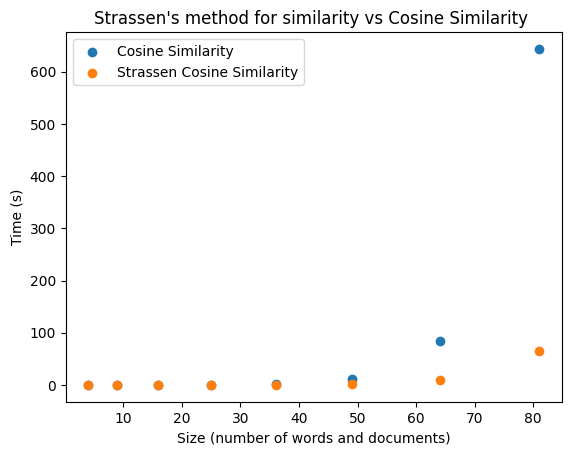

In [115]:
plt.scatter(dimensions, cosine_all_pairs_times_2, label='Cosine Similarity')
plt.scatter(dimensions, strassen_all_pairs_times, label='Strassen Cosine Similarity')

plt.xlabel('Size (number of words and documents)')
plt.ylabel('Time (s)')
plt.title("Strassen's method for similarity vs Cosine Similarity ")
plt.legend()

plt.show()

It is noticeable that, beyond a certain threshold, Strassen's method for matrix multiplication exhibits significantly enhanced efficiency in terms of time consumption, particularly for larger matrices as theory indicates. As illustrated in the graph, when the number of documents and words is below 30, the disparity in execution time between the two methods is nearly negligible. However, from around 35 onwards, Strassen's method demonstrates a notable efficiency. Beyond this threshold, the discrepancy in time-consuming between the two methods grows exponentially.

In [116]:
dimensions_log = [math.log(i) for i in dimensions]

In [117]:
cosine_all_pairs_times_2_log = [math.log(i) for i in cosine_all_pairs_times_2]
strassen_all_pairs_times_log = [math.log(i) for i in strassen_all_pairs_times]

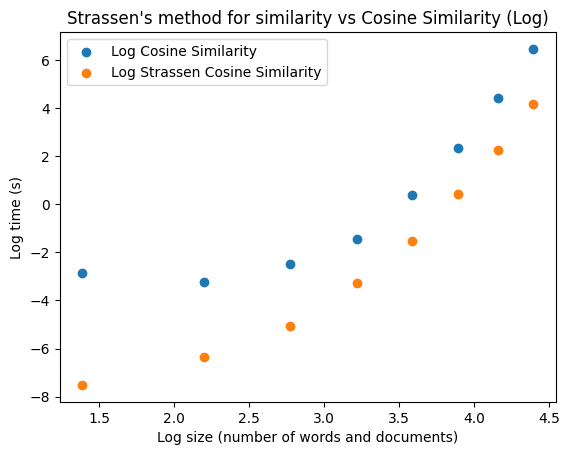

In [118]:
plt.scatter(dimensions_log , cosine_all_pairs_times_2_log, label='Log Cosine Similarity')
plt.scatter(dimensions_log , strassen_all_pairs_times_log, label='Log Strassen Cosine Similarity')

plt.xlabel('Log size (number of words and documents)')
plt.ylabel('Log time (s)')
plt.title("Strassen's method for similarity vs Cosine Similarity (Log)")
plt.legend()

plt.show()

In [119]:
# Key constant time for similarity using Strassen's method

jaccard_ca(dimensions_log, strassen_all_pairs_times_log)

Gradient:  3.8899042136526765
Interception: -14.552490302435837
Key constant  4.785570997576121e-07


In [120]:
# Key constant time for similarity using Cosine Similarity method

jaccard_ca(dimensions_log, cosine_all_pairs_times_2_log)

Gradient:  3.11610028308666
Interception: -9.523866016766336
Key constant  7.308656358674114e-05


--------------------

### Conclusion

In conclusion, it has been determined that both the Jaccard method and Cosine Similarity exhibit a time complexity of O(n), indicating that the execution time increases proportionally with the number of words in the documents. This observation is reflected in the gradients of the logarithmic regression lines, which approach one. Furthermore, comparisons between both methods reveal that the Jaccard method is approximately 30% faster.

More efficient alternatives were explored, such as utilizing the numpy dot product for Cosine Similarity calculations, demonstrating a constant execution time of O(1). Additionally, significant improvements are highlighted by applying parallelism in the Jaccard method, accelerating execution by approximately 60% for different datasets. The use of the Strassen method for matrix multiplication in Cosine Similarity is also mentioned, showing notable efficiency enhancements for large-dimensional matrices.

Ultimately, this report aims to enhance the understanding of the time complexity of the analyzed methods for practical applications in the field of document similarity.

Number of words: 1880